<h1>Global Landslide Catalog — End-to-End Machine Learning Project</h1>

<p>
This notebook presents a complete, beginner-friendly machine learning pipeline 
applied to the Global Landslide Catalog dataset.
</p>

<hr>

<h3> Workflow Overview</h3>

<ol>
  <li><b>Data Understanding</b></li>
  <li><b>Missing Value Analysis</b> (bar graph)</li>
  <li><b>Missing Value Heatmap</b></li>
  <li><b>Data Cleaning</b></li>
  <li><b>Outlier Handling</b></li>
  <li><b>Exploratory Data Analysis</b> (10 objectives, 10 graphs)</li>
  <li><b>Feature Engineering</b></li>
  <li><b>Train-Test Split</b></li>
  <li><b>Machine Learning Models</b></li>
  <li><b>Model Prediction + Graphs</b></li>
  <li><b>Model Evaluation</b></li>
  <li><b>Model Comparison</b></li>
  <li><b>Final Conclusion</b></li>
</ol>

<hr>

<h3> Visualization Approach</h3>

<p>
All visualizations in this project use <b> matplotlib settings</b>.
</p>

<ul>
  <li>custom colors</li>
  <li>styling or design enhancements</li>
  <li>Focus purely on clarity and understanding</li>
</ul>

<hr>

<p>
<b>Goal:</b> Build a clear, structured, and easy-to-understand machine learning workflow 
from raw data to final model comparison.
</p>

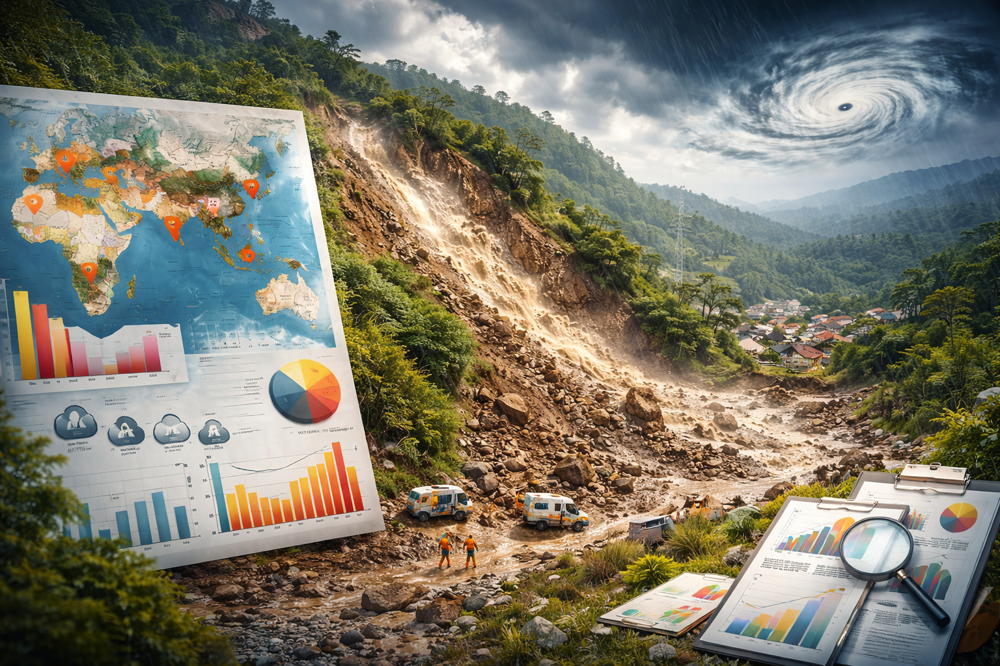

### 10 Objectives of This Project

- Distribution of landslide categories — bar plot showing how many events fall into each category (landslide, mudslide, rock_fall, etc.)
- Landslide trigger frequency — bar plot of the top triggers (downpour, rain, continuous_rain, etc.)
- Fatality count distribution — histogram showing how fatalities are spread across events
- Injury count distribution — histogram showing how injuries are spread across events
- Landslide size frequency — bar plot comparing small / medium / large / very_large events
- Country-wise landslide occurrences — bar plot of the top 15 countries by number of reported landslides
- Location accuracy distribution — bar plot showing how precisely events are geo-located (exact, 1km, 5km, 25km, etc.)
- Distance vs landslide impact — scatter plot of gazeteer distance vs fatality count
- Time-based trend — line plot of landslides per year
- Population vs landslide impact — scatter plot of admin division population vs fatality count

## Importing Libraries

In [185]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 50)

## 1. Data Understanding

In [186]:
df = pd.read_csv('Global Landslide Catalog.csv', encoding='latin-1')
df.head(10)

,source_name,source_link,event_id,event_date,event_time,event_title,event_description,location_description,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,storm_name,photo_link,notes,event_import_source,event_import_id,country_name,country_code,admin_division_name,admin_division_population,gazeteer_closest_point,gazeteer_distance,submitted_date,created_date,last_edited_date,longitude,latitude
0,AGU,https://blogs.agu.org/landslideblog/2008/10/14...,684,08-01-2008 00:00,NaN,"Sigou Village, Loufan County, Shanxi Province","occurred early in morning, 11 villagers buried...","Sigou Village, Loufan County, Shanxi Province",unknown,landslide,rain,large,mine,11.0,NaN,NaN,NaN,NaN,glc,684.0,China,CN,Shaanxi,0.0,Jingyang,41.02145,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,107.4500,32.5625
1,Oregonian,http://www.oregonlive.com/news/index.ssf/2009/...,956,01-02-2009 02:00,NaN,"Lake Oswego, Oregon",Hours of heavy rain are to blame for an overni...,"Lake Oswego, Oregon",5km,mudslide,downpour,small,unknown,0.0,NaN,NaN,NaN,NaN,glc,956.0,United States,US,Oregon,36619.0,Lake Oswego,0.60342,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-122.6630,45.4200
2,CBS News,https://www.cbsnews.com/news/dozens-missing-af...,973,01/19/2007 12:00:00 AM,NaN,"San Ramon district, 195 miles northeast of the...",(CBS/AP) At least 10 people died and as many a...,"San Ramon district, 195 miles northeast of the...",10km,landslide,downpour,large,unknown,10.0,NaN,NaN,NaN,NaN,glc,973.0,Peru,PE,Junï¿½,14708.0,San Ramï¿½,0.85548,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-75.3587,-11.1295
3,Reuters,https://in.reuters.com/article/idINIndia-41450...,1067,07/31/2009 12:00:00 AM,NaN,Dailekh district,"One person was killed in Dailekh district, pol...",Dailekh district,unknown,landslide,monsoon,medium,unknown,1.0,NaN,NaN,NaN,NaN,glc,1067.0,Nepal,NP,Mid Western,20908.0,Dailekh,0.75395,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,81.7080,28.8378
4,The Freeman,http://www.philstar.com/cebu-news/621414/lands...,2603,10/16/2010 12:00:00 PM,NaN,sitio Bakilid in barangay Lahug,Another landslide in sitio Bakilid in barangay...,sitio Bakilid in barangay Lahug,5km,landslide,tropical_cyclone,medium,unknown,0.0,NaN,Supertyphoon Juan (Megi),NaN,NaN,glc,2603.0,Philippines,PH,Central Visayas,798634.0,Cebu City,2.02204,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,123.8978,10.3336
5,BusinessWorld Online,http://www.bworldonline.com/content.php?sectio...,4203,02/16/2012 12:00:00 AM,NaN,"Paguite, Abuyog, Leyte",Thursdayï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½s landslide...,"Paguite, Abuyog, Leyte",5km,landslide,downpour,medium,unknown,0.0,NaN,NaN,NaN,NaN,glc,4203.0,Philippines,PH,Eastern Visayas,2404.0,Balinsacayao,2.28967,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,124.9668,10.7004
6,The Spokesman-Review,http://www.spokesman.com/stories/2012/mar/31/f...,4290,03/30/2012 12:00:00 AM,NaN,"Pend Oreille County, State Route 20 near Usk, OR","In Pend Oreille County, a mudslide on State Ro...","Pend Oreille County, State Route 20 near Usk, OR",5km,mudslide,downpour,small,unknown,0.0,NaN,NaN,NaN,NaN,glc,4290.0,United States,US,Washington,2126.0,Newport,19.97241,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-117.2665,48.2797
7,Crï¿½ï¿½ï¿½ï¿½ï,http://www.cronica.com.mx/notas/2007/320673.html,225,09-02-2007 00:00,NaN,3 killed in Acapulco,"3 killed, including 2 children when rocks fell...","calle Granjas, Ampliaciï¿½ï¿½ï¿½ï¿½ï¿½ï¿½n Mig...",10km,complex,tropical_cyclone,medium,unknown,3.0,NaN,Tropical Storm Henrietta,http://www.cronica.com.mx/oimagenes11/1/f94ae8...,NaN,glc,225.0,Mexico,MX,Sinaloa,3191.0,El Limï¿½ï¿½ï¿½ï¿½ï¿½ï,10.88351,04-01-2014 00:00,11/20/2017 03:17:00 PM,02/15/2018 03:51:00 PM,-107.6220,24.9531
8,MagicValley.com,http://magicvalley.com/news/local/first-fires-...,236,09-05-2007 00:00,NaN,"Warm Springs Road, Ida

In [187]:
print("Shape of dataset:", df.shape)

Shape of dataset: (11033, 31)


In [188]:
print("Column names:")
print(df.columns.tolist())

Column names:
['source_name', 'source_link', 'event_id', 'event_date', 'event_time', 'event_title', 'event_description', 'location_description', 'location_accuracy', 'landslide_category', 'landslide_trigger', 'landslide_size', 'landslide_setting', 'fatality_count', 'injury_count', 'storm_name', 'photo_link', 'notes', 'event_import_source', 'event_import_id', 'country_name', 'country_code', 'admin_division_name', 'admin_division_population', 'gazeteer_closest_point', 'gazeteer_distance', 'submitted_date', 'created_date', 'last_edited_date', 'longitude', 'latitude']


In [189]:
print("Data types:")
print(df.dtypes)

Data types:
source_name                   object
source_link                   object
event_id                       int64
event_date                    object
event_time                   float64
event_title                   object
event_description             object
location_description          object
location_accuracy             object
landslide_category            object
landslide_trigger             object
landslide_size                object
landslide_setting             object
fatality_count               float64
injury_count                 float64
storm_name                    object
photo_link                    object
notes                         object
event_import_source           object
event_import_id              float64
country_name                  object
country_code                  object
admin_division_name           object
admin_division_population    float64
gazeteer_closest_point        object
gazeteer_distance            float64
submitted_date            

In [190]:
df.describe(include='all').T.head(20)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
source_name,11033,3918,Oregon DOT,768,NaN,NaN,NaN,NaN,NaN,NaN,NaN
source_link,10187,8294,http://maps.google.com.br/maps/ms?source=embed...,104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event_id,11033.0,NaN,NaN,NaN,5598.953141,3249.228647,1.0,2785.0,5563.0,8435.0,11221.0
event_date,11033,6550,04-06-2010 00:00,115,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event_time,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event_title,11033,10549,El Ayote,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN
event_description,10171,9409,O mapa da devastaï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿...,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location_description,10931,10434,El Ayote,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location_accuracy,11031,9,5km,3178,NaN,NaN,NaN,NaN,NaN,NaN,NaN
landslide_category,11032,14,landslide,7648,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<h2> Dataset Overview</h2>

<p>
The <b>Global Landslide Catalog</b> is a collection of landslide events reported across the world.
Each row represents <b>one landslide event</b> with multiple types of information.
</p>

<hr>

<h3> Data Categories</h3>

<h4>1. Identifiers / Metadata</h4>
<ul>
  <li>event_id, source_name, source_link, event_import_id</li>
  <li>Used for tracking and reference, not useful for modeling</li>
</ul>

<h4>2. Time Information</h4>
<ul>
  <li>event_date, submitted_date, created_date, last_edited_date</li>
  <li>Helps analyze trends over time</li>
</ul>

<h4>3. Location Details</h4>
<ul>
  <li>longitude, latitude</li>
  <li>country_name, admin_division_name</li>
  <li>location_description</li>
  <li>Used for geographical analysis</li>
</ul>

<h4>4. Event Characteristics</h4>
<ul>
  <li>landslide_category</li>
  <li>landslide_trigger</li>
  <li>landslide_size</li>
  <li>landslide_setting</li>
  <li>Describe the nature and type of landslides</li>
</ul>

<h4>5. Impact Features</h4>
<ul>
  <li>fatality_count</li>
  <li>injury_count</li>
  <li>Measure the severity of the event</li>
</ul>

<h4>6. Additional Information</h4>
<ul>
  <li>storm_name, photo_link, notes</li>
  <li>admin_division_population, gazeteer_distance</li>
  <li>Provide contextual or supporting details</li>
</ul>

<hr>

<h3> Dataset Type</h3>
<ul>
  <li><b>Type:</b> Tabular dataset</li>
  <li><b>Data Types:</b> Numerical, Categorical, Datetime, Text</li>
  <li><b>Size:</b> ~11,000 rows, 31 columns</li>
</ul>

<hr>

<h3> Use Cases</h3>
<ul>
  <li><b>Classification:</b> Predict landslide_size</li>
  <li><b>Regression:</b> Predict fatality_count</li>
</ul>

## 2. Missing Value Analysis .
### This tells us which columns we can rely on and which ones are mostly empty.

In [191]:
missing_pct = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)
print(missing_pct)

event_time                   100.000000
notes                         97.126801
storm_name                    94.770235
photo_link                    86.440678
injury_count                  51.427536
admin_division_name           14.837306
country_code                  14.175655
event_import_source           14.166591
gazeteer_closest_point        14.166591
country_name                  14.157527
event_import_id               14.157527
admin_division_population     14.157527
gazeteer_distance             14.157527
fatality_count                12.553249
event_description              7.812925
source_link                    7.667905
location_description           0.924499
landslide_setting              0.625397
landslide_trigger              0.208466
submitted_date                 0.090637
landslide_size                 0.081573
location_accuracy              0.018127
landslide_category             0.009064
created_date                   0.009064
source_name                    0.000000


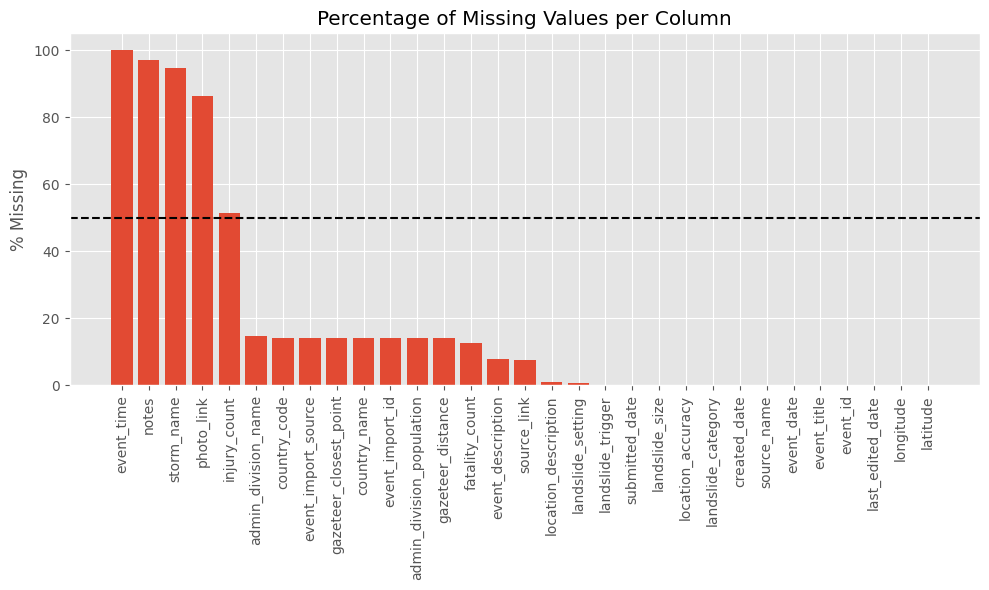

In [192]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(missing_pct)), missing_pct.values)
plt.xticks(range(len(missing_pct)), missing_pct.index, rotation=90)
plt.ylabel('% Missing')
plt.title('Percentage of Missing Values per Column')
plt.axhline(y=50, color='black', linestyle='--')
plt.tight_layout()
plt.show()

**Insight:** Columns like event_time, notes, storm_name and photo_link are almost entirely empty and should be dropped. injury_count is missing in about half the rows and needs careful handling — we will fill it with 0 because "no injury reported" is a reasonable assumption for a safety count.

## 3. Missing Value Heatmap (Graph 2)A black-and-white heatmap shows where the missing values are located. Black means missing, white means present.

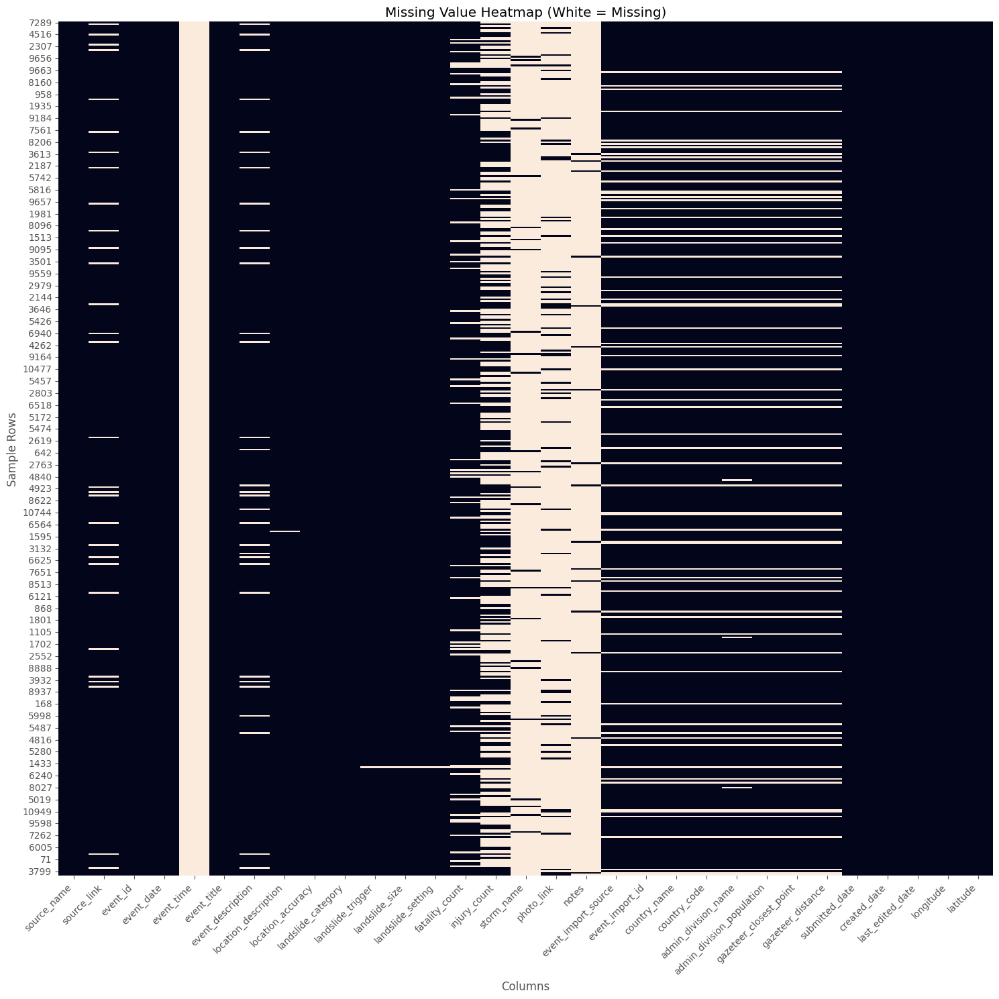

In [193]:
import seaborn as sns
import matplotlib.pyplot as plt

# Taking sample to avoid clutter
sample_df = df.sample(500)  

plt.figure(figsize=(15, 15))
sns.heatmap(sample_df.isnull(), cbar=False)

plt.title("Missing Value Heatmap (White = Missing)")
plt.xlabel("Columns")
plt.ylabel("Sample Rows")

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Insight:** Some columns are almost fully white ( missing value complete). Others show a clear pattern — for example, country_name, country_code, admin_division_name all miss together, which suggests the same group of rows lack any location metadata.

## 4. Data Cleaning
1. Drop columns that are mostly empty or are just identifiers / free text.
2. Convert date columns to proper datetime format.
3. Fill missing values — median for numeric, "unknown" for categorical, 0 for impact counts.
4. Remove duplicates.We keep injury_count and fatality_count because they are the most useful columns for understanding landslide impact.

In [194]:
# Columns to drop:
# - event_time: 100% missing
# - notes, storm_name, photo_link: > 85% missing
# - event_description, event_title, location_description, source_link, source_name: free text / URLs
# - event_id, event_import_id, event_import_source, gazeteer_closest_point: identifiers
drop_cols = [
    'event_time', 'notes', 'storm_name', 'photo_link',
    'event_description', 'event_title', 'location_description',
    'source_link', 'source_name',
    'event_id', 'event_import_id', 'event_import_source',
    'gazeteer_closest_point'
]
df = df.drop(columns=drop_cols)
print("Shape after dropping columns:", df.shape)

Shape after dropping columns: (11033, 18)


In [195]:
# Convert datetime columns. The file has two date styles mixed together,
# so we try the first format and fall back to the generic parser.
def parse_dates(series):
    s1 = pd.to_datetime(series, format='%m-%d-%Y %H:%M', errors='coerce')
    mask = s1.isnull()
    s2 = pd.to_datetime(series[mask], errors='coerce')
    s1[mask] = s2
    return s1

for dcol in ['event_date', 'submitted_date', 'created_date', 'last_edited_date']:
    df[dcol] = parse_dates(df[dcol])

print("event_date dtype:", df['event_date'].dtype)
print("event_date NaN after parsing:", df['event_date'].isnull().sum())

event_date dtype: datetime64[ns]
event_date NaN after parsing: 0


In [196]:
df.dtypes

event_date                   datetime64[ns]
location_accuracy                    object
landslide_category                   object
landslide_trigger                    object
landslide_size                       object
landslide_setting                    object
fatality_count                      float64
injury_count                        float64
country_name                         object
country_code                         object
admin_division_name                  object
admin_division_population           float64
gazeteer_distance                   float64
submitted_date               datetime64[ns]
created_date                 datetime64[ns]
last_edited_date             datetime64[ns]
longitude                           float64
latitude                            float64
dtype: object

In [197]:
# Fill important counts with 0
df['fatality_count'] = df['fatality_count'].fillna(0)
df['injury_count']   = df['injury_count'].fillna(0)

# Fill other numerical columns with median
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
for c in num_cols:
    if df[c].isnull().sum() > 0:
        df[c] = df[c].fillna(df[c].median())

# Fill categorical columns with "unknown"
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
for c in cat_cols:
    if df[c].isnull().sum() > 0:
        df[c] = df[c].fillna('unknown')

# Drop rows where event_date could not be parsed at all
df = df.dropna(subset=['event_date'])

# Remove duplicates
before = len(df)
df = df.drop_duplicates()
print(f"Duplicates removed: {before - len(df)}")
print("Shape after cleaning:", df.shape)
print("Remaining missing values:", df.isnull().sum().sum())

Duplicates removed: 14
Shape after cleaning: (11019, 18)
Remaining missing values: 11


In [198]:
df.isnull().sum()

event_date                    0
location_accuracy             0
landslide_category            0
landslide_trigger             0
landslide_size                0
landslide_setting             0
fatality_count                0
injury_count                  0
country_name                  0
country_code                  0
admin_division_name           0
admin_division_population     0
gazeteer_distance             0
submitted_date               10
created_date                  1
last_edited_date              0
longitude                     0
latitude                      0
dtype: int64

In [199]:
# Filling any remaining NaT in datetime columns with the column's median date
for dcol in ['submitted_date', 'created_date', 'last_edited_date']:
    df[dcol] = df[dcol].fillna(df[dcol].median())

In [200]:
df.isnull().sum()

event_date                   0
location_accuracy            0
landslide_category           0
landslide_trigger            0
landslide_size               0
landslide_setting            0
fatality_count               0
injury_count                 0
country_name                 0
country_code                 0
admin_division_name          0
admin_division_population    0
gazeteer_distance            0
submitted_date               0
created_date                 0
last_edited_date             0
longitude                    0
latitude                     0
dtype: int64

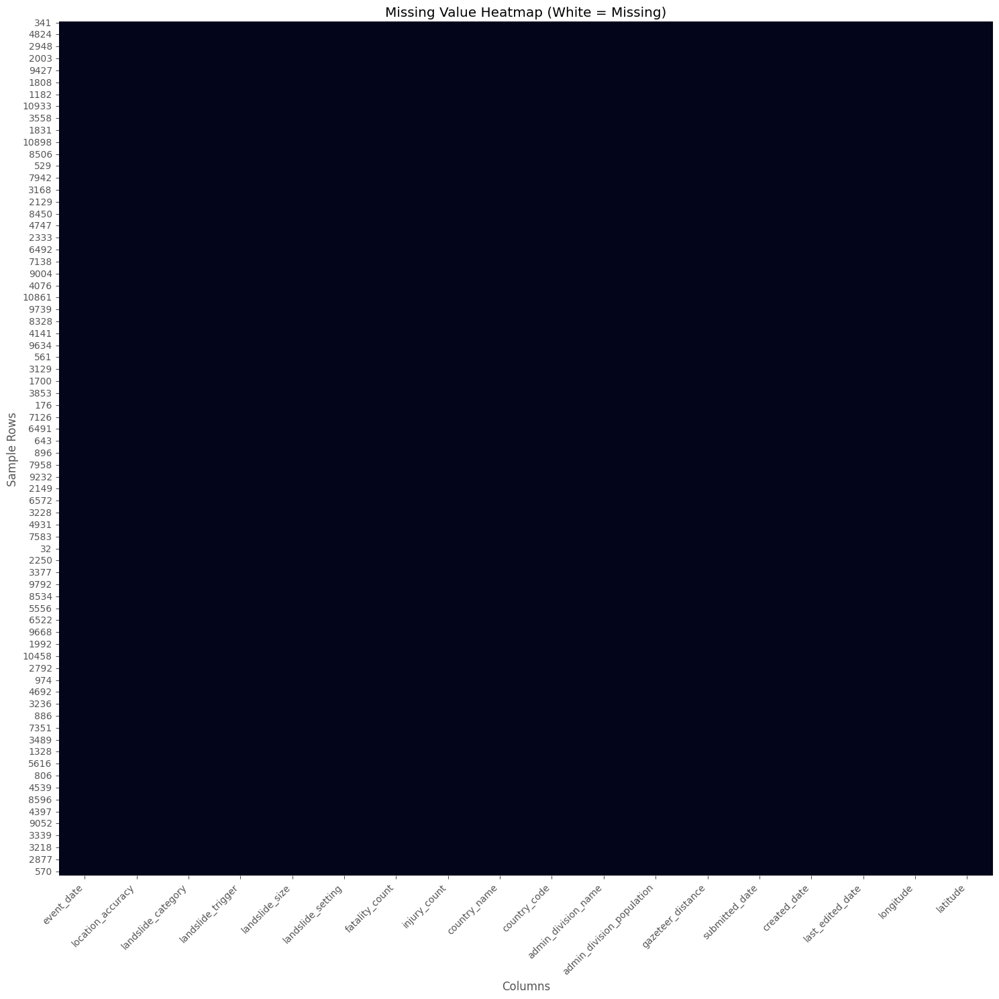

In [201]:
sample_df = df.sample(500)  

plt.figure(figsize=(15, 15))
sns.heatmap(sample_df.isnull(), cbar=False)

plt.title("Missing Value Heatmap (White = Missing)")
plt.xlabel("Columns")
plt.ylabel("Sample Rows")

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## 5. Outlier Handling:
Impact columns like fatality_count and injury_count are heavily skewed — most landslides cause zero fatalities but a few cause hundreds. Extreme values can pull regression models badly, so we cap them at the 99th percentile (winsorization). We do the same for admin_division_population and gazeteer_distance .We do not use a pure IQR rule here because when 75% of values are zero, the IQR collapses to 0 and would clip every non-zero value.

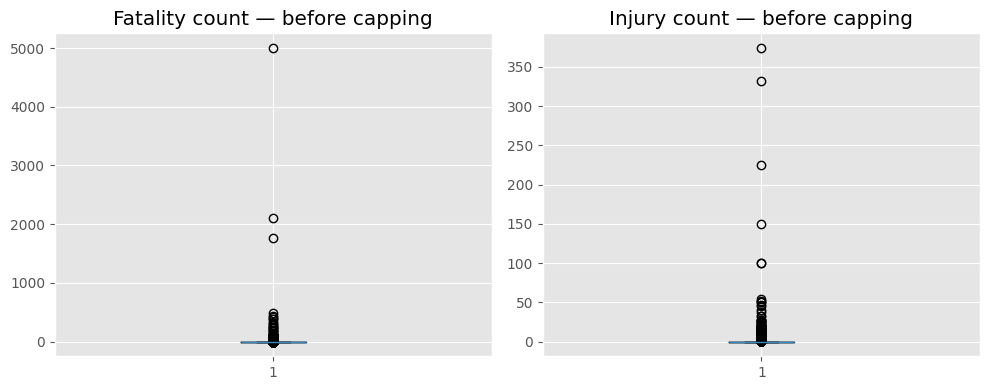

In [202]:
# Show a quick boxplot before capping
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].boxplot(df['fatality_count'])
axes[0].set_title('Fatality count — before capping')
axes[1].boxplot(df['injury_count'])
axes[1].set_title('Injury count — before capping')
plt.tight_layout()
plt.show()

In [203]:
def cap_p99(s):
    cap = s.quantile(0.99)
    return s.clip(upper=cap)

for c in ['fatality_count', 'injury_count', 'admin_division_population', 'gazeteer_distance']:
    if c in df.columns:
        df[c] = cap_p99(df[c])

print("After capping:")
df[['fatality_count', 'injury_count', 'admin_division_population', 'gazeteer_distance']].describe()

After capping:


,fatality_count,injury_count,admin_division_population,gazeteer_distance
count,11019.000000,11019.000000,1.101900e+04,11019.000000
mean,1.405572,0.166258,1.021924e+05,10.783957
std,4.709904,0.880571,4.136731e+05,12.660032
min,0.000000,0.000000,0.000000e+00,0.000030
25%,0.000000,0.000000,2.258500e+03,2.819115
50%,0.000000,0.000000,7.365000e+03,6.254870
75%,0.000000,0.000000,2.568500e+04,13.512295
max,35.000000,7.000000,3.433441e+06,67.305360


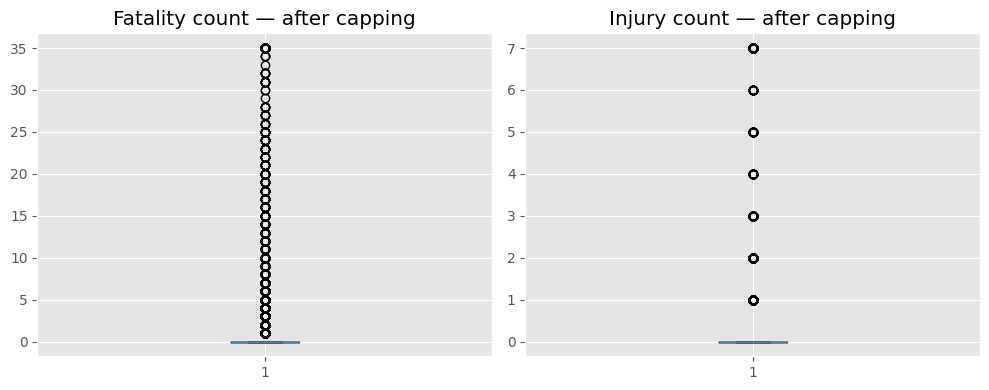

In [204]:
# Boxplot after winsorization (capping)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].boxplot(df['fatality_count'])
axes[0].set_title('Fatality count — after capping')
axes[1].boxplot(df['injury_count'])
axes[1].set_title('Injury count — after capping')
plt.tight_layout()
plt.show()

**Note: “The boxplots shows that casualty-related features were heavily skewed with extreme outliers. After applying 99th percentile capping, the distribution becomes more controlled, reducing the impact of extreme values on the model.Since most values are zero, the distribution is highly skewed. After capping, the box collapses at zero, making even small non-zero values appear as outliers in the boxplot.”**

## 6. Exploratory Data Analysis (10 Objectives, 10 Graphs)Each objective has one simple, default matplotlib chart and a one-line insight.

### Objective 1 — Distribution of landslide categories

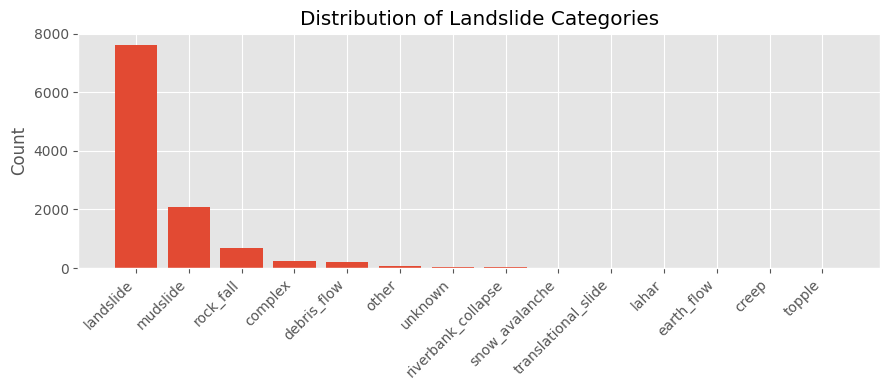

In [205]:
cat_counts = df['landslide_category'].value_counts()
plt.figure(figsize=(9, 4))
plt.bar(range(len(cat_counts)), cat_counts.values)
plt.xticks(range(len(cat_counts)), cat_counts.index, rotation=45, ha='right')
plt.ylabel('Count')
plt.title('Distribution of Landslide Categories')
plt.tight_layout()
plt.show()

In [206]:
cat_counts

landslide_category
landslide              7635
mudslide               2099
rock_fall               671
complex                 232
debris_flow             194
other                    68
unknown                  39
riverbank_collapse       37
snow_avalanche           15
translational_slide       9
lahar                     7
earth_flow                7
creep                     5
topple                    1
Name: count, dtype: int64

**Insight:** The generic "landslide" category dominates by a wide margin, followed by "mudslide" and "rock_fall". Rare types like "topple" or "creep" barely appear.

### Objective 2 — Landslide trigger frequency

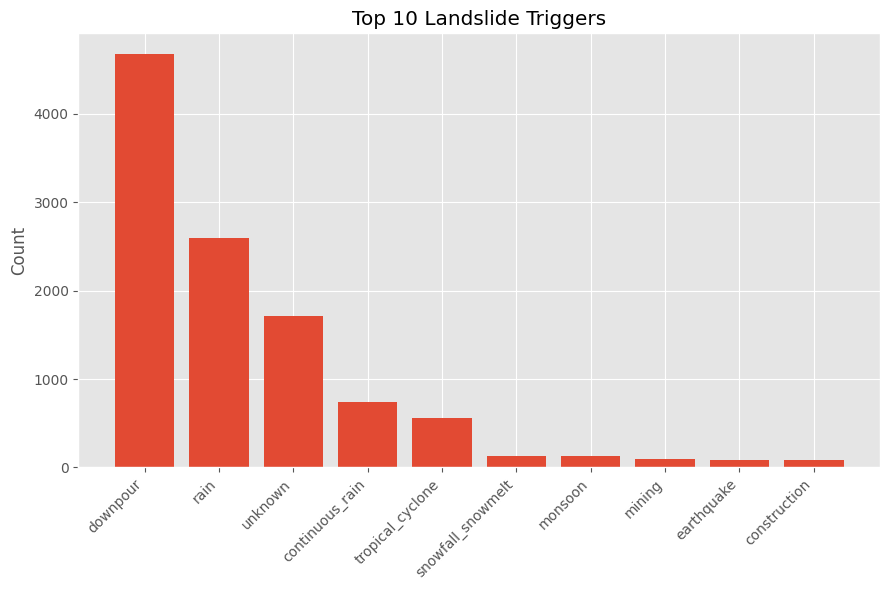

In [207]:
trig_counts = df['landslide_trigger'].value_counts().head(10)
plt.figure(figsize=(9,6))
plt.bar(range(len(trig_counts)), trig_counts.values)
plt.xticks(range(len(trig_counts)), trig_counts.index, rotation=45, ha='right')
plt.ylabel('Count')
plt.title('Top 10 Landslide Triggers')
plt.tight_layout()
plt.show()

**Insight:** Rain-related triggers (downpour, rain, continuous_rain, tropical_cyclone, monsoon) cause the vast majority of landslides. Water is by far the biggest driver.

### Objective 3 — Fatality count distribution

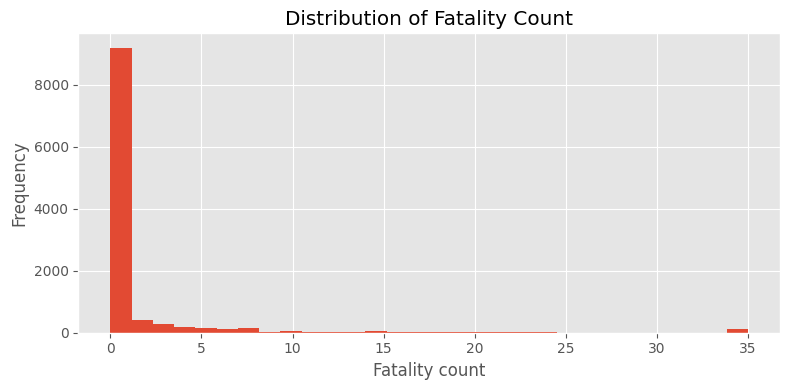

In [208]:
plt.figure(figsize=(8, 4))
plt.hist(df['fatality_count'], bins=30)
plt.xlabel('Fatality count')
plt.ylabel('Frequency')
plt.title('Distribution of Fatality Count')
plt.tight_layout()
plt.show()

**Insight:** Fatalities are extremely right-skewed — most landslides kill nobody, only a small tail causes many deaths (even after capping at the 99th percentile).

### Objective 4 — Injury count distribution

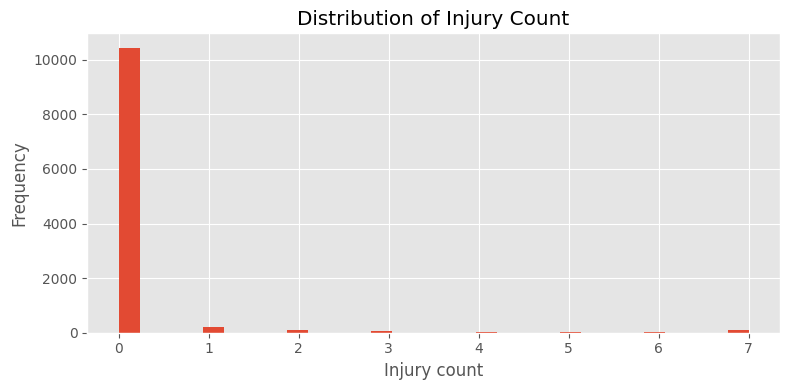

In [209]:
plt.figure(figsize=(8, 4))
plt.hist(df['injury_count'], bins=30)
plt.xlabel('Injury count')
plt.ylabel('Frequency')
plt.title('Distribution of Injury Count')
plt.tight_layout()
plt.show()

**Insight:** Same pattern as fatalities — most events report zero injuries. The "unknown" half of this column originally has been treated as 0, which reinforces the skew.

### Objective 5 — Landslide size frequency

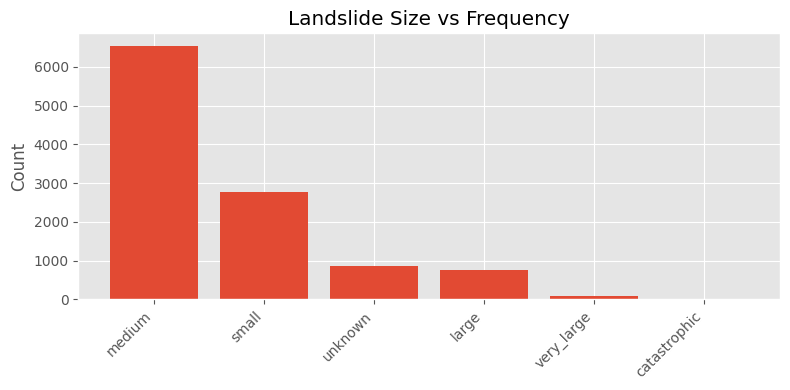

In [210]:
size_counts = df['landslide_size'].value_counts()
plt.figure(figsize=(8, 4))
plt.bar(range(len(size_counts)), size_counts.values)
plt.xticks(range(len(size_counts)), size_counts.index, rotation=45, ha='right')
plt.ylabel('Count')
plt.title('Landslide Size vs Frequency')
plt.tight_layout()
plt.show()

In [211]:
print(size_counts)

landslide_size
medium          6540
small           2765
unknown          860
large            749
very_large       102
catastrophic       3
Name: count, dtype: int64


**Insight:** "medium" is the most common labelled size, followed by "small". "catastrophic" events are extremely rare (only a few rows).

### Objective 6 — Country-wise landslide occurrences

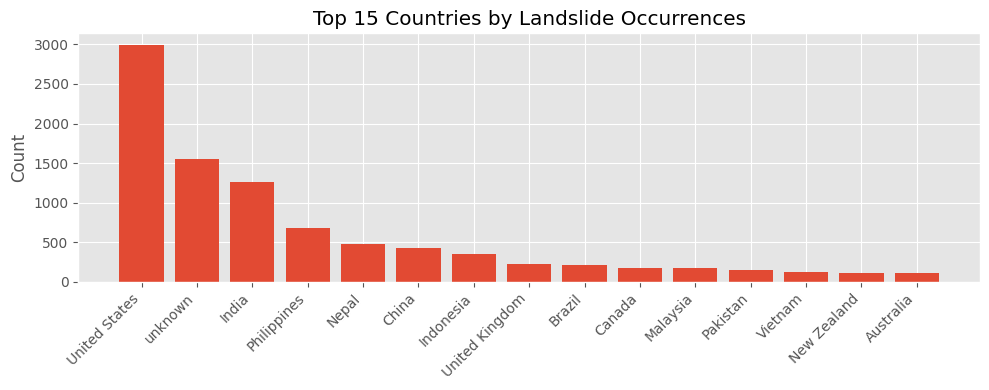

In [212]:
country_counts = df['country_name'].value_counts().head(15)
plt.figure(figsize=(10, 4))
plt.bar(range(len(country_counts)), country_counts.values)
plt.xticks(range(len(country_counts)), country_counts.index, rotation=45, ha='right')
plt.ylabel('Count')
plt.title('Top 15 Countries by Landslide Occurrences')
plt.tight_layout()
plt.show()

**Insight:** The United States reports far more landslides than any other country, followed by India, the Philippines and China. This partly reflects actual geology and partly reflects reporting effort.

### Objective 7 — Location accuracy distribution

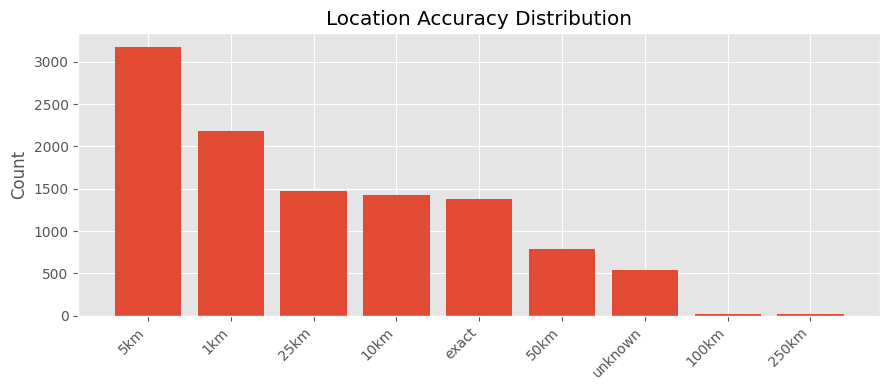

In [213]:
acc_counts = df['location_accuracy'].value_counts()
plt.figure(figsize=(9, 4))
plt.bar(range(len(acc_counts)), acc_counts.values)
plt.xticks(range(len(acc_counts)), acc_counts.index, rotation=45, ha='right')
plt.ylabel('Count')
plt.title('Location Accuracy Distribution')
plt.tight_layout()
plt.show()

**Insight:** Most events are pinned to within 1–25 km rather than an exact point — which is typical when events are drawn from news reports instead of GPS surveys.

### Objective 8 — Distance to nearest named place vs frequency

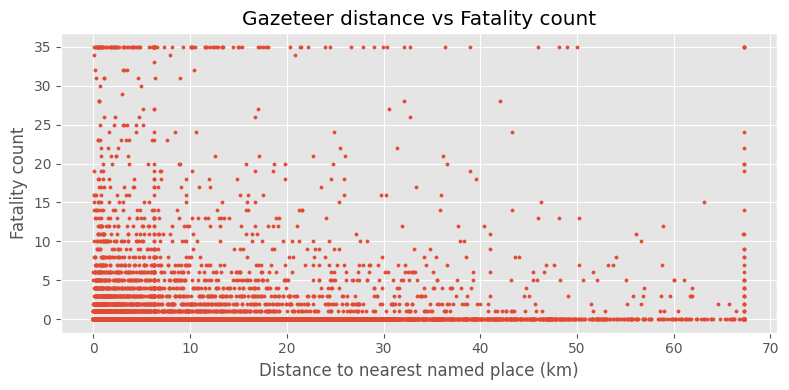

In [214]:
plt.figure(figsize=(8, 4))
plt.scatter(df['gazeteer_distance'], df['fatality_count'], s=5)
plt.xlabel('Distance to nearest named place (km)')
plt.ylabel('Fatality count')
plt.title('Gazeteer distance vs Fatality count')
plt.tight_layout()
plt.show()

**Insight:** There is no strong relationship between the gazeteer distance and fatality count — deadly events occur both near and far from named places.

### Objective 9 — Time-based trend (landslides per year)

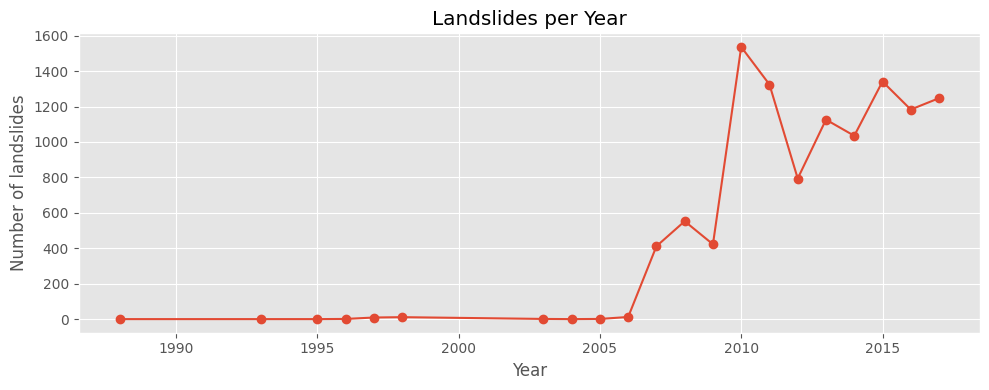

In [215]:
df['year'] = df['event_date'].dt.year
df['month'] = df['event_date'].dt.month
yearly = df.groupby('year').size()

plt.figure(figsize=(10, 4))
plt.plot(yearly.index, yearly.values, marker='o')
plt.xlabel('Year')
plt.ylabel('Number of landslides')
plt.title('Landslides per Year')
plt.tight_layout()
plt.show()

**Insight:** Reported landslides rise sharply from 2007 onwards (when the catalog started) and peak around 2010–2011, then level off. Most of the shape reflects reporting activity, not necessarily real frequency.

### Objective 10 — Population vs landslide impact

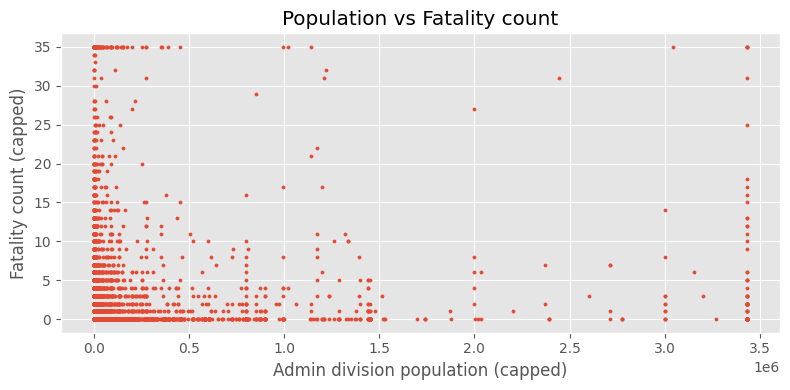

In [216]:
plt.figure(figsize=(8, 4))
plt.scatter(df['admin_division_population'], df['fatality_count'], s=5)
plt.xlabel('Admin division population (capped)')
plt.ylabel('Fatality count (capped)')
plt.title('Population vs Fatality count')
plt.tight_layout()
plt.show()

**Insight:** Even after capping, no clear linear relationship appears — high-fatality events happen across the full population range, suggesting population alone doesn't predict landslide deaths.

## 7. Feature Engineering:
Now we prepare the data for modeling: Extract year and month from event_date (done above).- Drop the original datetime columns (models cannot consume them directly).- Encode all remaining categorical columns with simple LabelEncoder.- Create **two** modeling dataframes:  - **Classification** *target: landslide_size (drop rows labelled "unknown"; merge the tiny "catastrophic" class into "very_large")*.  - **Regression** *target: fatality_count*.

In [217]:
from sklearn.preprocessing import LabelEncoder

# Remove raw datetime columns (year/month already extracted)
model_df = df.drop(columns=['event_date', 'submitted_date', 'created_date', 'last_edited_date'])
print("model_df shape:", model_df.shape)
print("model_df dtypes:\n", model_df.dtypes)

model_df shape: (11019, 16)
model_df dtypes:
 location_accuracy             object
landslide_category            object
landslide_trigger             object
landslide_size                object
landslide_setting             object
fatality_count               float64
injury_count                 float64
country_name                  object
country_code                  object
admin_division_name           object
admin_division_population    float64
gazeteer_distance            float64
longitude                    float64
latitude                     float64
year                           int32
month                          int32
dtype: object


In [218]:
# --- Classification prep ---
clf_df = model_df[model_df['landslide_size'] != 'unknown'].copy()
# Merge very rare class 'catastrophic' (3 rows) into 'very_large' so stratified split works

clf_df['landslide_size'] = clf_df['landslide_size'].replace({'catastrophic': 'very_large'})
print("Classification class counts:")
print(clf_df['landslide_size'].value_counts())

Classification class counts:
landslide_size
medium        6540
small         2765
large          749
very_large     105
Name: count, dtype: int64


In [219]:
# Encode all object columns in classification dataframe
clf_encoded = clf_df.copy()

for c in clf_encoded.select_dtypes(include='object').columns:
    clf_encoded[c] = LabelEncoder().fit_transform(clf_encoded[c].astype(str))
print("Encoded dtypes:", clf_encoded.dtypes.unique())

Encoded dtypes: [dtype('int64') dtype('float64') dtype('int32')]


In [220]:
clf_encoded.head()

,location_accuracy,landslide_category,landslide_trigger,landslide_size,landslide_setting,fatality_count,injury_count,country_name,country_code,admin_division_name,admin_division_population,gazeteer_distance,longitude,latitude,year,month
0,8,5,12,0,8,11.0,0.0,26,29,681,0.0,41.02145,107.4500,32.5625,2008,8
1,6,6,3,2,12,0.0,0.0,134,129,549,36619.0,0.60342,-122.6630,45.4200,2009,1
2,1,5,3,0,12,10.0,0.0,97,99,326,14708.0,0.85548,-75.3587,-11.1295,2007,1
3,8,5,9,1,12,1.0,0.0,86,95,453,20908.0,0.75395,81.7080,28.8378,2009,7
4,6,5,14,1,12,0.0,0.0,98,101,128,798634.0,2.02204,123.8978,10.3336,2010,10


In [221]:
# --- Regression prep ---

reg_encoded = model_df.copy()
for c in reg_encoded.select_dtypes(include='object').columns:
    reg_encoded[c] = LabelEncoder().fit_transform(reg_encoded[c].astype(str))
print("Regression data shape:", reg_encoded.shape)

Regression data shape: (11019, 16)


## 8. Train-Test Split 
Standard set =  80/20 split. For the classification task we use **stratify** so every class appears in both sets.

In [222]:
from sklearn.model_selection import train_test_split

# Classification
y_cls = clf_encoded['landslide_size']
X_cls = clf_encoded.drop(columns=['landslide_size'])
X_tr, X_te, y_tr, y_te = train_test_split(
    X_cls, y_cls, test_size=0.2, random_state=42, stratify=y_cls
)
print("Classification split:", X_tr.shape, X_te.shape)

Classification split: (8127, 15) (2032, 15)


In [223]:
# Regression
y_reg = reg_encoded['fatality_count']
X_reg = reg_encoded.drop(columns=['fatality_count'])
Xr_tr, Xr_te, yr_tr, yr_te = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42
)
print("Regression split:", Xr_tr.shape, Xr_te.shape)

Regression split: (8815, 15) (2204, 15)


In [224]:
# Scaling (pre-processing) features for distance / margin based models (KNN, SVM, Log.Reg)
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_tr_s = sc.fit_transform(X_tr)
X_te_s = sc.transform(X_te)

## 9. Machine Learning Models
We will apply 8 models using their parameters : <br>
**1. Linear Regression** — regression only (predicts fatality_count) <br>
**2. Logistic Regression**<br>
**3. K-Nearest Neighbors**<br>
**4. Gaussian Naive Bayes**<br>
**5. Support Vector Machine** <br>
**6. Decision Tree** <br>
**7. Random Forest** <br>
**8. XGBoost** 

In [225]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [226]:
# Train regression model
lin_reg = LinearRegression()
lin_reg.fit(Xr_tr, yr_tr)
pred_reg = lin_reg.predict(Xr_te)
print("Linear Regression trained.")

Linear Regression trained.


In [227]:
# Train classification models
models = {
    'Logistic Regression': (LogisticRegression(max_iter=1000), True),
    'KNN':                 (KNeighborsClassifier(),           True),
    'Naive Bayes':         (GaussianNB(),                     False),
    'SVM':                 (SVC(),                            True),
    'Decision Tree':       (DecisionTreeClassifier(random_state=42), False),
    'Random Forest':       (RandomForestClassifier(random_state=42), False),
    xgb_name:              (xgb_model,                        False),
}

predictions = {}
for name, (m, need_scale) in models.items():
    if need_scale:
        m.fit(X_tr_s, y_tr)
        predictions[name] = m.predict(X_te_s)
    else:
        m.fit(X_tr, y_tr)
        predictions[name] = m.predict(X_te)
    print(f"{name} trained.")

Logistic Regression trained.
KNN trained.
Naive Bayes trained.
SVM trained.
Decision Tree trained.
Random Forest trained.
XGBoost trained.


## 10. Model Prediction + GraphsFor regression we plot actual vs predicted. For each classifier we show a simple confusion matrix.

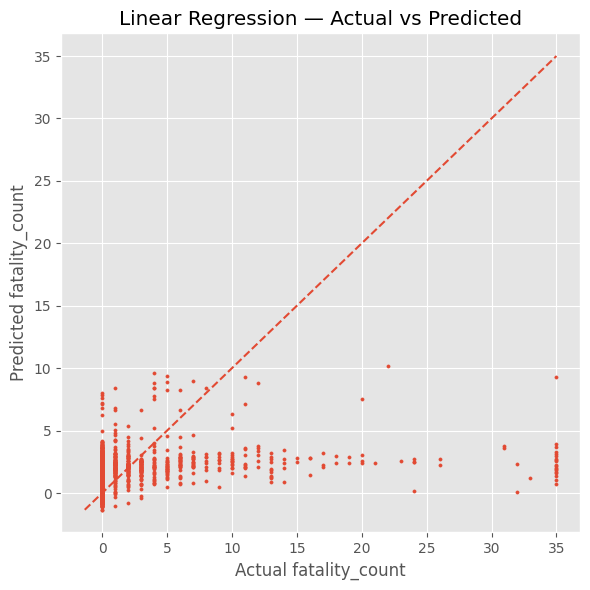

In [228]:
# Regression: actual vs predicted
plt.figure(figsize=(6, 6))
plt.scatter(yr_te, pred_reg, s=5)
lims = [min(yr_te.min(), pred_reg.min()), max(yr_te.max(), pred_reg.max())]
plt.plot(lims, lims, linestyle='--')
plt.xlabel('Actual fatality_count')
plt.ylabel('Predicted fatality_count')
plt.title('Linear Regression — Actual vs Predicted')
plt.tight_layout()
plt.show()

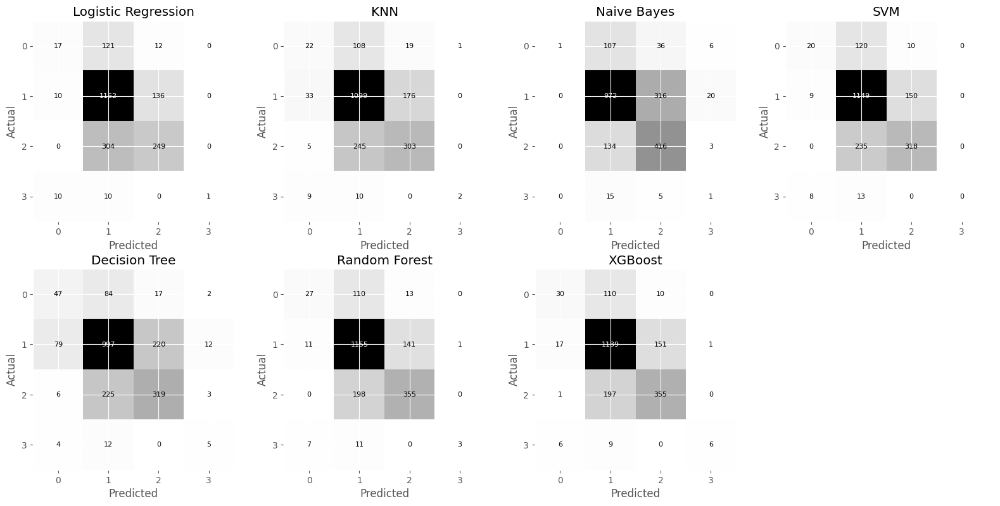

In [229]:
# Confusion matrix for each classifier
from sklearn.metrics import confusion_matrix

class_labels = sorted(y_te.unique())

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()
for i, (name, preds) in enumerate(predictions.items()):
    cm = confusion_matrix(y_te, preds, labels=class_labels)
    ax = axes[i]
    ax.imshow(cm, cmap='gray_r')
    ax.set_title(name)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_xticks(range(len(class_labels)))
    ax.set_yticks(range(len(class_labels)))
    ax.set_xticklabels(class_labels)
    ax.set_yticklabels(class_labels)
    # write cell counts
    for r in range(cm.shape[0]):
        for c in range(cm.shape[1]):
            ax.text(c, r, str(cm[r, c]), ha='center', va='center',
                    color='white' if cm[r, c] > cm.max()/2 else 'black',
                    fontsize=8)
# Hide last empty axis if any
for j in range(i+1, len(axes)):
    axes[j].axis('off')
plt.tight_layout()
plt.show()

## 11. Model EvaluationRegression uses **R²**, **MAE**, **RMSE**. Classification uses **Accuracy**, **Precision**, **Recall**, **F1** (weighted averages so class imbalance is accounted for).

In [230]:
from sklearn.metrics import (r2_score, mean_absolute_error, mean_squared_error,
                              accuracy_score, precision_score, recall_score, f1_score)

# Regression metrics
r2   = r2_score(yr_te, pred_reg)
mae  = mean_absolute_error(yr_te, pred_reg)
rmse = np.sqrt(mean_squared_error(yr_te, pred_reg))
print("Linear Regression")
print(f"  R2   : {r2:.4f}")
print(f"  MAE  : {mae:.4f}")
print(f"  RMSE : {rmse:.4f}")

Linear Regression
  R2   : 0.0806
  MAE  : 2.0323
  RMSE : 4.4045


In [231]:
# Classification metrics
rows = []
for name, preds in predictions.items():
    rows.append({
        'Model':     name,
        'Accuracy':  accuracy_score(y_te, preds),
        'Precision': precision_score(y_te, preds, average='weighted', zero_division=0),
        'Recall':    recall_score(y_te, preds, average='weighted', zero_division=0),
        'F1-score':  f1_score(y_te, preds, average='weighted', zero_division=0),
    })
results_df = pd.DataFrame(rows).sort_values('Accuracy', ascending=False).reset_index(drop=True)
results_df

,Model,Accuracy,Precision,Recall,F1-score
0,Random Forest,0.757874,0.746242,0.757874,0.739355
1,XGBoost,0.752953,0.741001,0.752953,0.737602
2,SVM,0.731791,0.708502,0.731791,0.707290
3,Logistic Regression,0.703248,0.683308,0.703248,0.671983
4,KNN,0.701772,0.679885,0.701772,0.684249
5,Naive Bayes,0.684055,0.730131,0.684055,0.665577
6,Decision Tree,0.673228,0.670928,0.673228,0.672010


## 12. Model ComparisonLet's compare models on Accuracy to pick a winner.

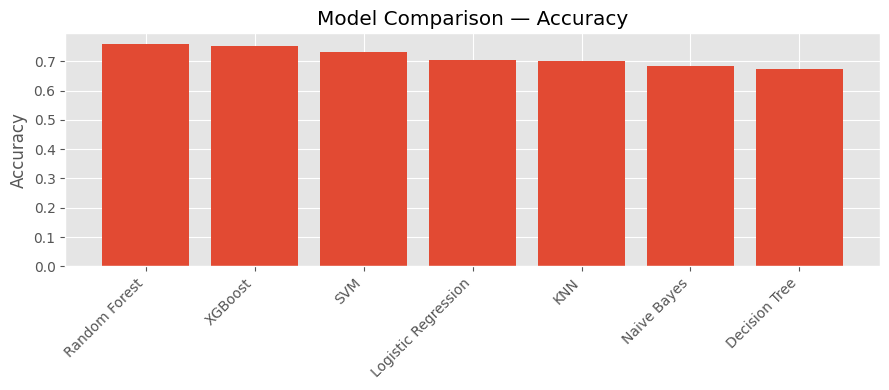

Best model: Random Forest
Accuracy : 0.7579
F1-score : 0.7394


In [232]:
plt.figure(figsize=(9, 4))
plt.bar(range(len(results_df)), results_df['Accuracy'])
plt.xticks(range(len(results_df)), results_df['Model'], rotation=45, ha='right')
plt.ylabel('Accuracy')
plt.title('Model Comparison — Accuracy')
plt.tight_layout()
plt.show()

best = results_df.iloc[0]
print(f"Best model: {best['Model']}")
print(f"Accuracy : {best['Accuracy']:.4f}")
print(f"F1-score : {best['F1-score']:.4f}")

<h3>Why the Best Model Performed Best</h3>

<p>
Tree-based ensemble models such as <b>Random Forest</b> and <b>XGBoost (Gradient Boosting)</b> performed best for this dataset due to their strong compatibility with real-world tabular data.
</p>

<ul>
  <li>
    <b>Handles mixed data types:</b> These models work well with both numerical and encoded categorical features without requiring heavy preprocessing.
  </li>

  <li>
    <b>Captures non-linear relationships:</b> They can automatically learn complex interactions such as 
    <i>rain × terrain × season</i> without manual feature engineering.
  </li>

  <li>
    <b>Robust to outliers:</b> Unlike linear models, tree-based methods are less affected by extreme values.
  </li>

  <li>
    <b>Reduces overfitting:</b> Ensemble methods combine multiple trees, making predictions more stable compared to a single decision tree.
  </li>
</ul>

<hr>

<h4> Why Other Models Performed Worse</h4>

<ul>
  <li>
    <b>Linear models (Logistic Regression):</b> Assume linear relationships, which do not match the complex patterns in the dataset.
  </li>

  <li>
    <b>Distance-based models (KNN):</b> Sensitive to feature scaling and struggle with high-dimensional or skewed data.
  </li>

  <li>
    <b>Naive Bayes:</b> Assumes feature independence and simple distributions, which is unrealistic for this dataset.
  </li>

  <li>
    <b>SVM:</b> Requires careful tuning and struggles with large, noisy, and highly skewed datasets.
  </li>
</ul>

<hr>

<p>
<b>Conclusion:</b> The dataset contains mixed data types, non-linear relationships, and skewed distributions. 
Tree-based ensemble models handle these characteristics effectively, making them the best-performing choice.
</p>

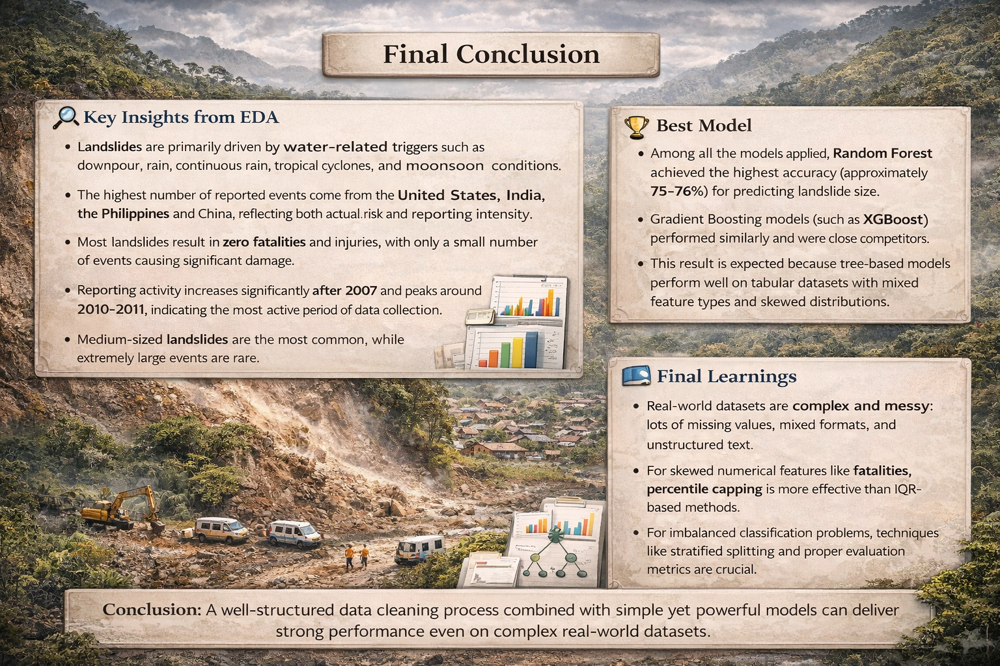